## validation의 abnormal case를 2개로 구분해서 각각 분석하자

wrong case  
71       1  
1047     0  
1210     0  
4039     1  
7000     0  
9326     1  
14221    1  
15306    0  
19113    0  
28146    1  

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.ensemble import IsolationForest
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, precision_recall_curve, auc,roc_auc_score,average_precision_score

from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

In [2]:
train_df = pd.read_csv('../dataset/train.csv')
val_df = pd.read_csv('../dataset/val.csv')
test_df = pd.read_csv('../dataset/test.csv')

In [3]:
np.where(val_df.Class.values  == 1)[0]

array([   71,   641,   677,   836,  1196,  1201,  1547,  3055,  4039,
        4267,  4396,  7702,  9326, 12377, 12797, 13706, 14221, 15027,
       15029, 15030, 15054, 15345, 15425, 24110, 24358, 24742, 25042,
       25504, 27998, 28146])

In [4]:
val_2nd_index = np.array([71, 4039, 9326, 14221, 28146])
arr = np.zeros(len(val_df), dtype=np.uint)

In [5]:
val_df.Class = 0
arr[val_2nd_index] = 1

In [6]:
val_df.Class = arr

In [7]:
val_df.Class.value_counts()

0    28457
1        5
Name: Class, dtype: int64

In [8]:
val_feature = val_df.drop(columns=['ID', 'Class'])
val_feature.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30
0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,-0.255991,-0.994878
1,0.962496,0.328461,-0.171479,2.109204,1.129566,1.696038,0.107712,0.521502,-1.191311,0.724396,...,0.143997,0.402492,-0.048508,-1.371866,0.390814,0.199964,0.016371,-0.014605,0.168937,-0.994784
2,1.145524,0.575068,0.194008,2.598192,-0.092210,-1.044430,0.531588,-0.241888,-0.896287,0.757952,...,0.011106,-0.119703,-0.076510,0.691320,0.633984,0.048741,-0.053192,0.016251,0.169496,-0.994502
3,0.927060,-0.323684,0.387585,0.544474,0.246787,1.650358,-0.427576,0.615371,0.226278,-0.225495,...,-0.040513,0.079359,0.096632,-0.992569,0.085096,0.377447,0.036096,-0.005960,0.331307,-0.994467
4,-3.005237,2.600138,1.483691,-2.418473,0.306326,-0.824575,2.065426,-1.829347,4.009259,6.051521,...,-0.852309,-0.181268,-0.163747,0.515821,0.136318,0.460054,-0.251259,-1.105751,-0.287012,-0.994373


In [9]:
# val_feature = val_feature *(val_feature)

In [10]:
val_feature.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30
0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,...,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,-0.255991,-0.994878
1,0.962496,0.328461,-0.171479,2.109204,1.129566,1.696038,0.107712,0.521502,-1.191311,0.724396,...,0.143997,0.402492,-0.048508,-1.371866,0.390814,0.199964,0.016371,-0.014605,0.168937,-0.994784
2,1.145524,0.575068,0.194008,2.598192,-0.092210,-1.044430,0.531588,-0.241888,-0.896287,0.757952,...,0.011106,-0.119703,-0.076510,0.691320,0.633984,0.048741,-0.053192,0.016251,0.169496,-0.994502
3,0.927060,-0.323684,0.387585,0.544474,0.246787,1.650358,-0.427576,0.615371,0.226278,-0.225495,...,-0.040513,0.079359,0.096632,-0.992569,0.085096,0.377447,0.036096,-0.005960,0.331307,-0.994467
4,-3.005237,2.600138,1.483691,-2.418473,0.306326,-0.824575,2.065426,-1.829347,4.009259,6.051521,...,-0.852309,-0.181268,-0.163747,0.515821,0.136318,0.460054,-0.251259,-1.105751,-0.287012,-0.994373


In [11]:
val_df.head()

,ID,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,V29,V30,Class
0,10,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,-0.255991,-0.994878,0
1,22,0.962496,0.328461,-0.171479,2.109204,1.129566,1.696038,0.107712,0.521502,-1.191311,...,0.402492,-0.048508,-1.371866,0.390814,0.199964,0.016371,-0.014605,0.168937,-0.994784,0
2,63,1.145524,0.575068,0.194008,2.598192,-0.092210,-1.044430,0.531588,-0.241888,-0.896287,...,-0.119703,-0.076510,0.691320,0.633984,0.048741,-0.053192,0.016251,0.169496,-0.994502,0
3,69,0.927060,-0.323684,0.387585,0.544474,0.246787,1.650358,-0.427576,0.615371,0.226278,...,0.079359,0.096632,-0.992569,0.085096,0.377447,0.036096,-0.005960,0.331307,-0.994467,0
4,83,-3.005237,2.600138,1.483691,-2.418473,0.306326,-0.824575,2.065426,-1.829347,4.009259,...,-0.181268,-0.163747,0.515821,0.136318,0.460054,-0.251259,-1.105751,-0.287012,-0.994373,0


In [12]:
val_df.iloc[:, 1:-1] = val_feature
val_df.head()

,ID,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V22,V23,V24,V25,V26,V27,V28,V29,V30,Class
0,10,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,...,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,-0.255991,-0.994878,0
1,22,0.962496,0.328461,-0.171479,2.109204,1.129566,1.696038,0.107712,0.521502,-1.191311,...,0.402492,-0.048508,-1.371866,0.390814,0.199964,0.016371,-0.014605,0.168937,-0.994784,0
2,63,1.145524,0.575068,0.194008,2.598192,-0.092210,-1.044430,0.531588,-0.241888,-0.896287,...,-0.119703,-0.076510,0.691320,0.633984,0.048741,-0.053192,0.016251,0.169496,-0.994502,0
3,69,0.927060,-0.323684,0.387585,0.544474,0.246787,1.650358,-0.427576,0.615371,0.226278,...,0.079359,0.096632,-0.992569,0.085096,0.377447,0.036096,-0.005960,0.331307,-0.994467,0
4,83,-3.005237,2.600138,1.483691,-2.418473,0.306326,-0.824575,2.065426,-1.829347,4.009259,...,-0.181268,-0.163747,0.515821,0.136318,0.460054,-0.251259,-1.105751,-0.287012,-0.994373,0


In [13]:
# scaler에 dataframe이 들어갈 경우 각 column별로 적용이 됨을 확인함, 확실치 않을 경우 column별로 진행할 것.
# val_df[val_df.columns.values[1:-1]] = scaler.fit_transform(val_df[val_df.columns.values[1:-1]])
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
col=[col for col in val_df.columns if col not in ['ID','Class']]

for i in col:
    # sc=RobustScaler()
    sc = MinMaxScaler(feature_range=(-1,1))
    val_df[i]=sc.fit_transform(val_df[i].values.reshape(-1,1))

In [14]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)

X2D = pca.fit_transform(val_df.drop(columns=['ID', 'Class']))
X2D = pd.DataFrame(X2D, columns=['pca1', 'pca2'])
X2D['Class'] = val_df['Class']
X2D.head()

,pca1,pca2,Class
0,1.105096,0.206841,0
1,1.122018,-0.282613,0
2,1.095985,-0.353550,0
3,1.114311,-0.155006,0
4,1.114700,-0.119764,0


Text(0, 0.5, 'pca2')

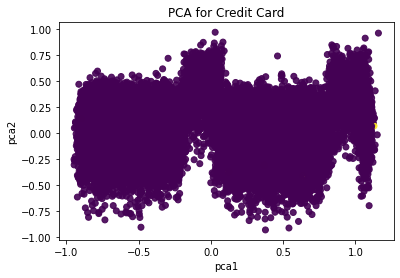

In [15]:
sample = X2D.sample(frac=1)
plt.scatter(sample['pca1'], sample['pca2'], c=sample['Class'], alpha=0.9)
plt.title('PCA for Credit Card')
plt.xlabel('pca1')
plt.ylabel('pca2')

In [16]:
from sklearn.decomposition import PCA
scaler = PCA(n_components=3)

X3D = scaler.fit_transform(val_df.drop(columns=['ID', 'Class']))
X3D = pd.DataFrame(X3D, columns=['pca1', 'pca2', 'pca3'])
X3D['Class'] = val_df['Class']
X3D.head()

,pca1,pca2,pca3,Class
0,1.105096,0.206812,0.021797,0
1,1.122018,-0.282607,-0.025540,0
2,1.095985,-0.353548,0.067525,0
3,1.114311,-0.155018,0.088832,0
4,1.114700,-0.119802,0.074382,0


In [17]:
sample = X3D.sample(frac=1)
import plotly.express as px
fig = px.scatter_3d(sample, x='pca1', y='pca2', z='pca3', color='Class')
fig.show()

In [39]:
u, s, v = np.linalg.svd(val_df.drop(columns=['ID', 'Class']).to_numpy(), full_matrices=False)
s

array([357.31851793,  93.62771875,  40.54141839,  36.76173667,
        34.74286924,  31.43483431,  27.86785796,  27.23472804,
        23.97425155,  21.74139577,  21.12711821,  18.80263063,
        16.97751811,  16.61507899,  15.63776858,  15.36741909,
        14.27697027,  13.70014591,  12.22045164,  10.60949491,
        10.23884101,   9.5173285 ,   9.43119979,   7.54808121,
         7.15965933,   6.74342656,   5.99027645,   4.77424469,
         4.34809724,   2.63751317])

In [40]:
s[:1] = s[:1]*0.5
s[2:] = s[2:]*0.1
s

array([178.65925897,  93.62771875,   4.05414184,   3.67617367,
         3.47428692,   3.14348343,   2.7867858 ,   2.7234728 ,
         2.39742515,   2.17413958,   2.11271182,   1.88026306,
         1.69775181,   1.6615079 ,   1.56377686,   1.53674191,
         1.42769703,   1.37001459,   1.22204516,   1.06094949,
         1.0238841 ,   0.95173285,   0.94311998,   0.75480812,
         0.71596593,   0.67434266,   0.59902765,   0.47742447,
         0.43480972,   0.26375132])

In [41]:
val = pd.DataFrame(u @ np.diag(s) @ v)
# val['Class'] = val_df['Class']
val.head()

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,0.416221,0.213859,0.466938,-0.185386,-0.047296,0.083290,0.041036,0.191270,0.041368,0.146911,...,-0.127057,0.053695,0.072427,-0.073561,0.060206,-0.146825,0.033979,-0.158380,-0.515969,-1.047945
1,0.415293,0.206897,0.452908,-0.153631,-0.044149,0.095694,0.038176,0.189966,0.035294,0.150222,...,-0.122544,0.065798,0.071235,-0.102634,0.068178,-0.138836,0.030900,-0.156044,-0.505321,-1.060969
2,0.418960,0.208658,0.455235,-0.149599,-0.049199,0.076401,0.039992,0.186746,0.038789,0.151155,...,-0.123732,0.059632,0.071494,-0.039288,0.071621,-0.146381,0.030265,-0.156489,-0.507553,-1.038278
3,0.413004,0.203440,0.453622,-0.170993,-0.047692,0.094908,0.036131,0.189465,0.051322,0.143939,...,-0.122901,0.061137,0.071524,-0.090608,0.062471,-0.130495,0.030951,-0.155161,-0.502497,-1.053445
4,0.381906,0.211060,0.454092,-0.202384,-0.046937,0.076314,0.044163,0.174086,0.094129,0.178261,...,-0.125535,0.056335,0.069247,-0.042960,0.062945,-0.124547,0.027395,-0.161956,-0.495702,-1.052366


In [42]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X2D = pca.fit_transform(val)
X2D = pd.DataFrame(X2D, columns=['pca1', 'pca2'])
X2D['Class'] = val_df['Class']

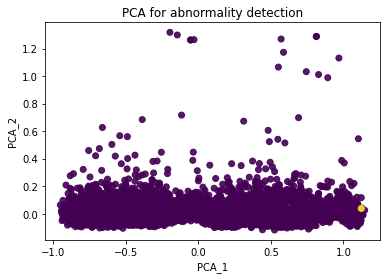

In [43]:
samp = X2D.sample(frac=1)
plt.scatter(samp['pca1'],samp['pca2'],c=samp['Class'],alpha=0.9);
plt.title('PCA for abnormality detection');
plt.xlabel('PCA_1');
plt.ylabel('PCA_2');

In [44]:
from sklearn.decomposition import PCA 

pca=PCA(n_components=3)
X3D=pca.fit_transform(val)

X3D=pd.DataFrame(X3D,columns=['pca1','pca2','pca3'])
X3D['Class']=val_df['Class']

# We can change the frac value to reduce the points plotted 
samp=X3D.sample(frac=1)

In [45]:
import plotly.express as px
fig = px.scatter_3d(samp, x='pca1', y='pca2', z='pca3',
              color='Class')
fig.show()